Importing Libraries and Dependencies

In [128]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import librosa
import librosa.display
import tensorflow as tf
import scipy
from scipy import misc
import glob
from PIL import Image
import os
from pydub import AudioSegment
import math
import json
import cv2

from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics.pairwise import cosine_similarity
from keras import layers
from keras.layers import (Input, Dropout, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten,
                          Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D)
from keras.models import Model, load_model
from keras.preprocessing import image
from keras.utils import layer_utils
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model
from keras.optimizers import Adam
from keras.initializers import glorot_uniform
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from pydub import AudioSegment
import shutil
from keras.preprocessing.image import ImageDataGenerator
import random
import torch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from tensorflow import keras
from unet import unet

Loading a sound file.

This needs two things, a variable for the audio data (this will actually be a NumPy array for an audio file),
and a variable for the sampling rate of the audio file.

In our first example these variables will be 'y' and 's' accordingly, with slight name changes to describe the genre used.

In [191]:
# Loading a sound file
metal_y, sr = librosa.load('/Users/frisbi01/Coding/DS course/Phase 3/Final Project/Data/genres_original/metal/metal.00003.wav')

What trim function does, is keep only the data that audio is actually there. It puts some threshold (usually amplitude) to trim the file when nothing is heard at the start and at the end of the 'event'.

In [192]:
# Trimming the file
metal_yt, _ = librosa.effects.trim(metal_y)

Let's try to now show a waveform of a random audio file. Our vertical axis is the Amplitude and the horizontal axis is time.

Text(0.5, 1.0, 'Sound Waves on Metal')

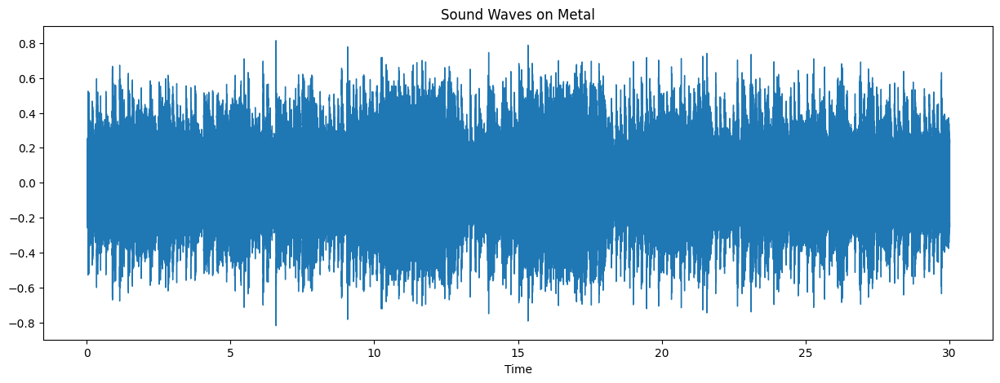

In [193]:
# Plotting a waveform of the file
plt.figure(figsize=(15,5))
librosa.display.waveshow(y = metal_yt, sr = sr)
plt.title("Sound Waves on Metal")

We can now try to transform the audio from the time domain to the frequency domain. This is done using the fast Fourier transformation and will create a Spectrum of the file.

We can use the function 'stft' for the plotting of the transformation. n_fft and hop length are the length of the windowed signal and the size of the fast Fourier tranform accordingly.

The colors shown is tied to the amplitude

Text(0, 0.5, 'Amplitude')

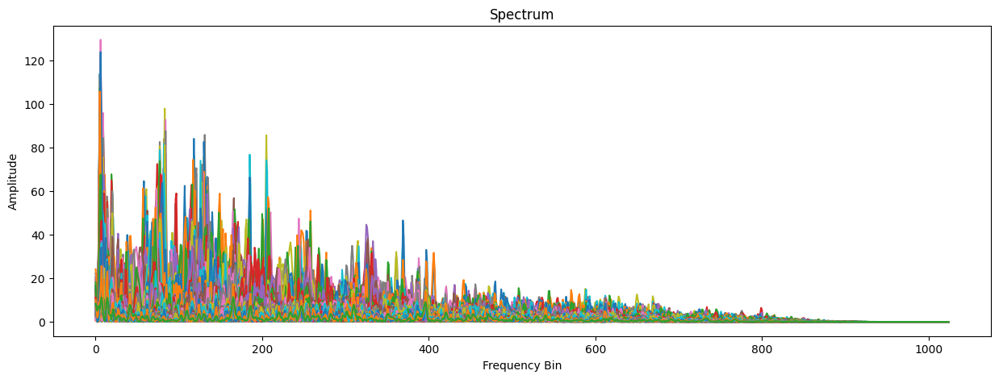

In [54]:
# Assigning important factors and plotting a spectrum
n_fft = 2048
hop_length = 512
plt.figure(figsize=(15, 5))
metal_ft = np.abs(librosa.stft(metal_yt, n_fft=n_fft, hop_length = hop_length))
plt.plot(metal_ft)
plt.title('Spectrum')
plt.xlabel('Frequency Bin')
plt.ylabel('Amplitude')

Now that we have our Amplitude - Frequency visualisation, we can try to create a Spectrogram, which is actually a Time - Frequency visualisation of the sound.

In a spectrogram, our vetrical axis is the frequency, our parallel axis is time, and we can also have out amplitudes represented as heat.

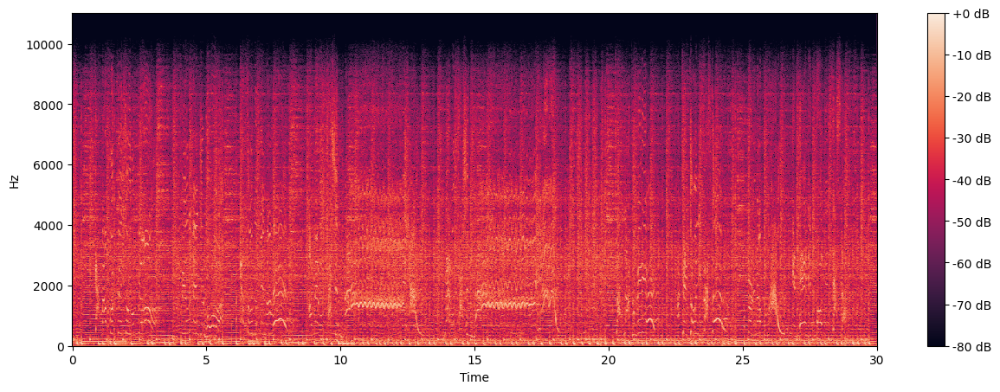

In [55]:
# Plotting a spectrogram
n_fft = 2048
SP = librosa.amplitude_to_db(metal_ft, ref = np.max)
plt.figure(figsize=(15, 5))
librosa.display.specshow(SP, sr = sr, hop_length = 512, x_axis='time', y_axis='linear', cmap = 'rocket')
plt.colorbar(format='%+2.0f dB')

Next step is to make a Mel Spectrogram. It's the same as a normal spectogram but with the Mel Scale on the vertical axis. What the Mel scale transformation does, is it mimics our perception of the difference in sound frequency distances.

/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/1455693175.py:1: FutureWarning: Pass y=[ 0.0395813   0.02209473 -0.01251221 ... -0.06118774 -0.04156494
  0.06515503] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  S = librosa.feature.melspectrogram(metal_y, sr = sr)


Text(0.5, 1.0, 'Metal Mel Spectogram')

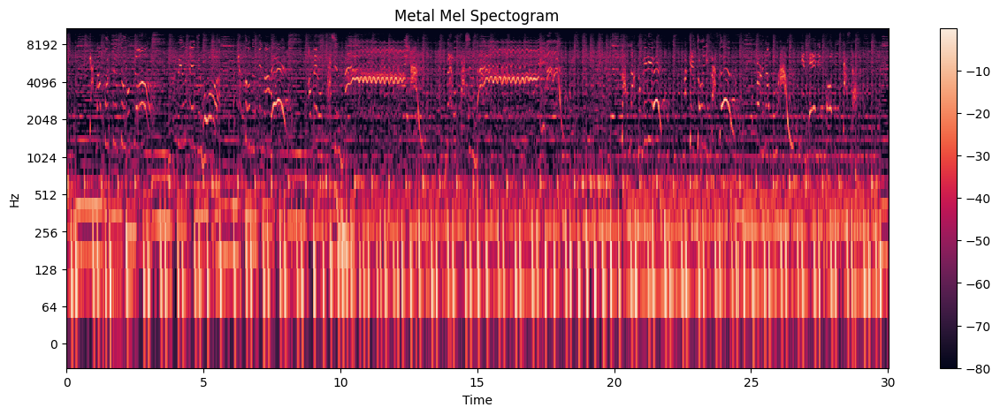

In [56]:
# Plotting a Mel Spectrogram
S = librosa.feature.melspectrogram(metal_y, sr = sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)
plt.figure(figsize = (15, 5))
librosa.display.specshow(S_DB, sr = sr, hop_length = 512, x_axis = 'time', y_axis = 'log', cmap = 'rocket')
plt.colorbar()
plt.title("Metal Mel Spectogram")


Another important visualisation is the Mel Frequency Cepstral Coefficients of MFCC in short and these are really good in representinting timbre. Here we are converting Hertz to Mel Scale so we end up with a spectrum over Mel frequencies as opposed to time.

/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/3730936999.py:1: FutureWarning: Pass y=[ 0.0395813   0.02209473 -0.01251221 ... -0.06118774 -0.04156494
  0.06515503] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  metal_mfcc = librosa.feature.mfcc(metal_y)


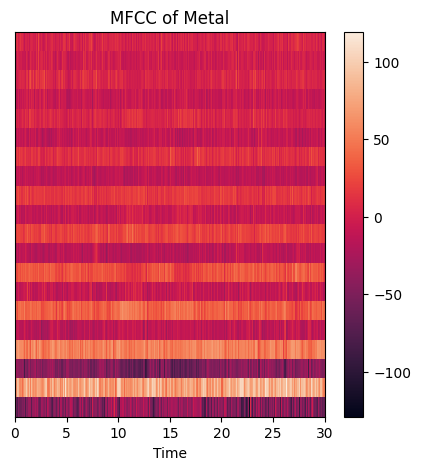

In [57]:
# Plotting an MFCC
metal_mfcc = librosa.feature.mfcc(metal_y)
plt.figure(figsize=(5,5))
librosa.display.specshow(metal_mfcc, x_axis='time', cmap='rocket', sr=sr,)
plt.title('MFCC of Metal')
plt.colorbar()

We will now show the Zero Crossing Rate which is the rate at which the signal changes from positive to negative. This is quite usefull to  distinguish between the nature of sound like for example if it is percussive or not.

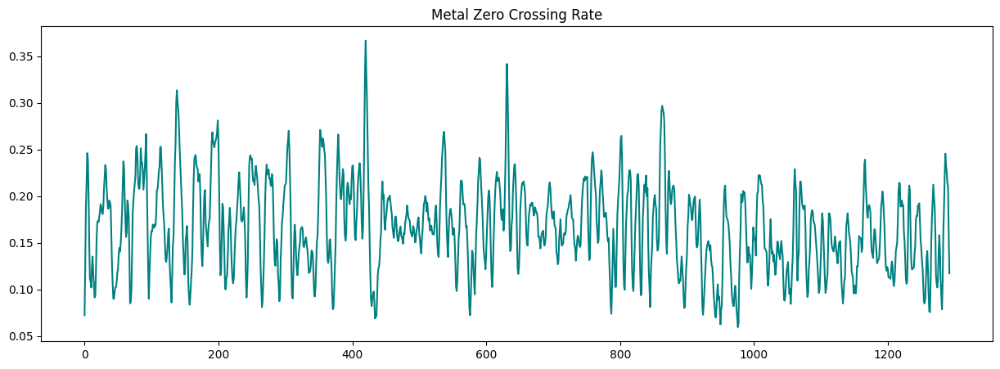

In [58]:
# Plotting the ZCR
metal_zero_crossing_rate = librosa.feature.zero_crossing_rate(y = metal_y, hop_length=hop_length)[0]
plt.figure(figsize=(15,5))
plt.title('Metal Zero Crossing Rate')
plt.plot(metal_zero_crossing_rate, color='teal')
plt.show()

We can also find out the Harmonics and percussive components of a song. Harmonics represent the timbre of a sound, since they are waves produced by our fundamental frequency and it's dependand on the material vibrating.

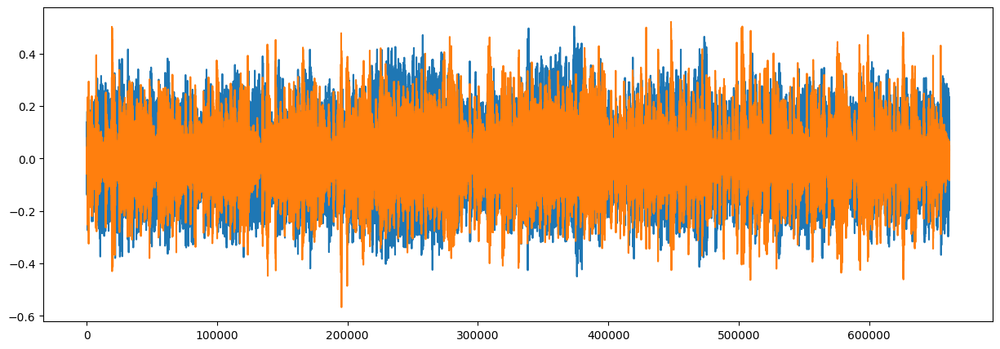

In [59]:
# Plotting the Harmonics and percussive components in blue and orange accordingly
metal_y_harm, metal_y_perc = librosa.effects.hpss(metal_y)

plt.figure(figsize=(15,5))
plt.plot(metal_y_harm)
plt.plot(metal_y_perc)
plt.show()

We can also use a dynamic beat tracker which might be useful for our recommendation application.

In [60]:
# Speculating the tempo of a song
metal_tempo, _ = librosa.beat.beat_track(metal_y, sr=sr)
metal_tempo

/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/2081706133.py:1: FutureWarning: Pass y=[ 0.0395813   0.02209473 -0.01251221 ... -0.06118774 -0.04156494
  0.06515503] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  metal_tempo, _ = librosa.beat.beat_track(metal_y, sr=sr)


99.38401442307692

Chromagrams are projecting our sound into 12 bins which represent the 12 different pitchs of the musical scale that reside inside an octave. It is actually a heatmap that represents how pitch is changing over time.

/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/158871743.py:1: FutureWarning: Pass y=[ 0.0395813   0.02209473 -0.01251221 ... -0.06118774 -0.04156494
  0.06515503] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  metal_chromagram = librosa.feature.chroma_stft(metal_y, sr=sr, hop_length=hop_length)


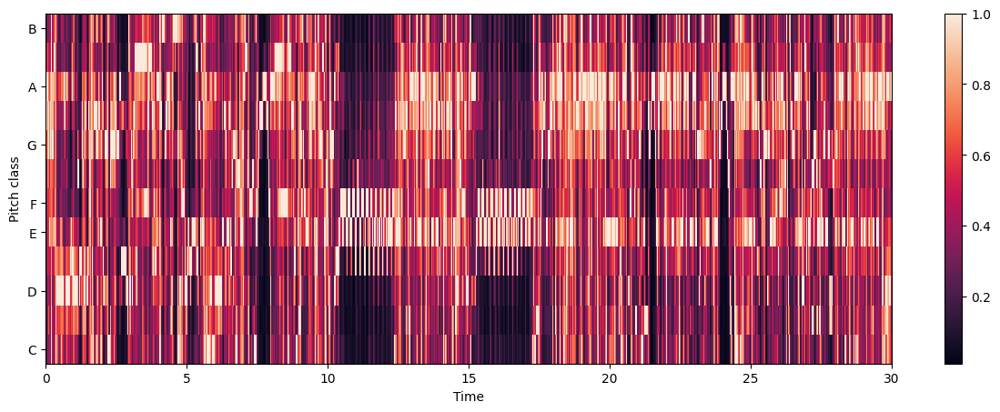

In [61]:
# Plotting a Chromagram
metal_chromagram = librosa.feature.chroma_stft(metal_y, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15,5))
librosa.display.specshow(metal_chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='rocket')
plt.colorbar()

Now let's make some comparison between genres with the above methods

In [62]:
# Making a dictionary of the genres
genre_dict = {"blues":0,"classical":1,"country":2,"disco":3,"hiphop":4,"jazz":5,"metal":6,"pop":7,"reggae":8,"rock":9}

In [63]:
# Making a variable with the path name so it makes inputing audio easier
path = "/Users/frisbi01/Coding/DS course/Phase 3/Final Project/Data"
audio_path = path + "/genres_original/"

# We might also make use of the images so let's put that path in a variable as well
images_path = path + "/iamges_original/"

Waveforms

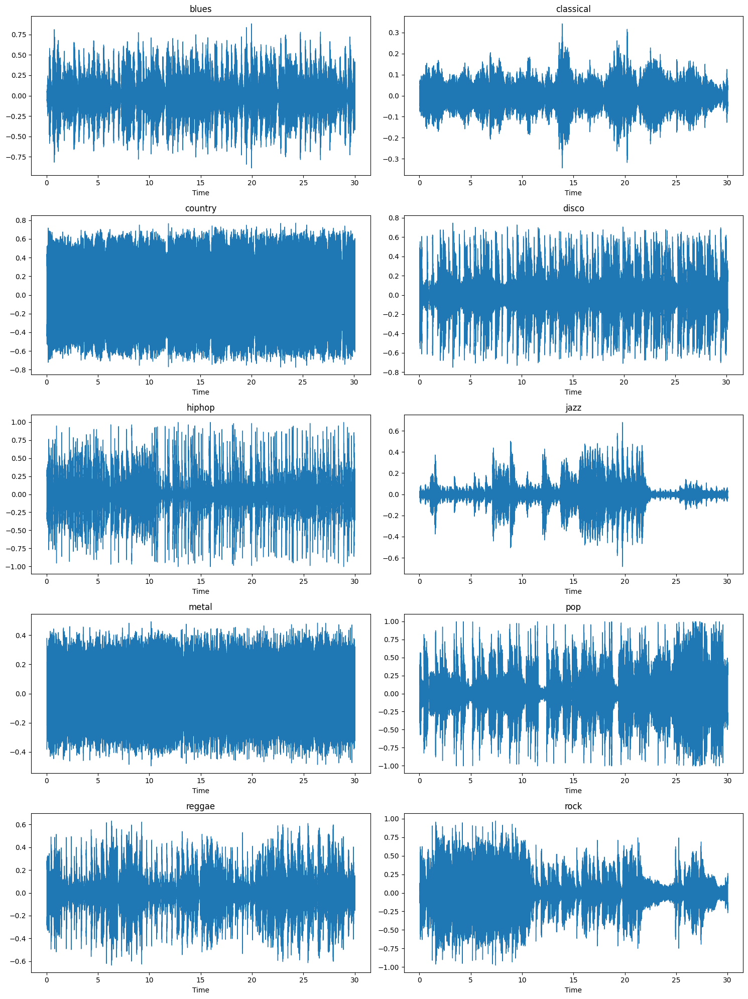

In [64]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    librosa.display.waveshow(y = data, sr = sr, ax=ax[i][j])
 

    ax[i][j].set_title(genre)

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Zero Crossing Rate

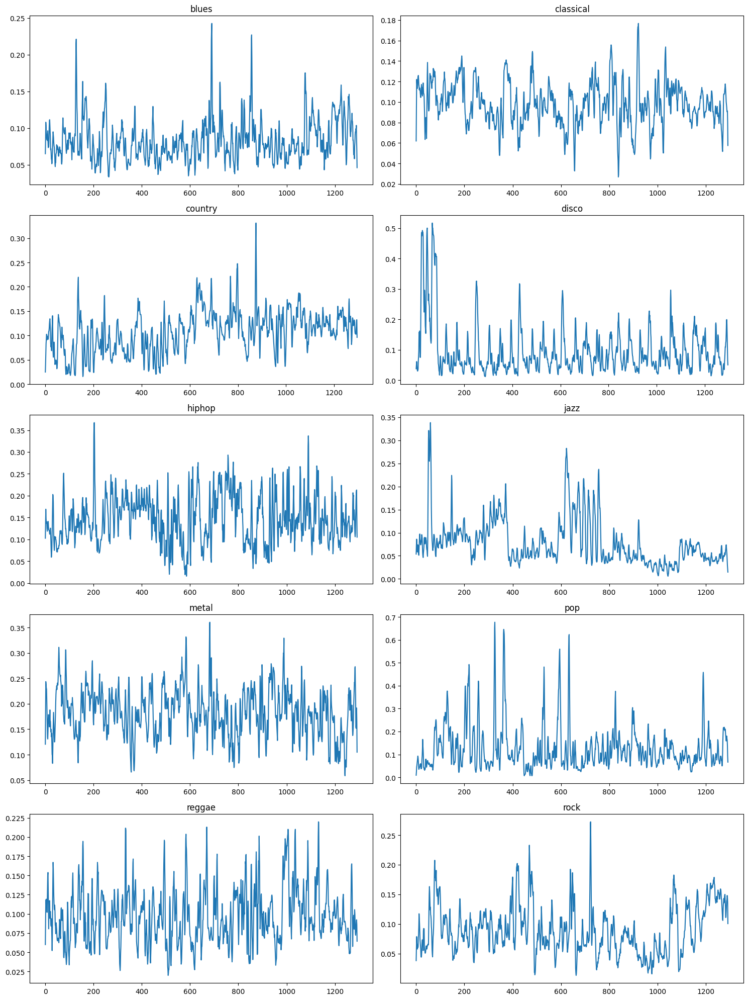

In [65]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    zero_crossing_rate = librosa.feature.zero_crossing_rate(y = data, hop_length=hop_length)[0]
    
    ax[i][j].plot(zero_crossing_rate)
    
    ax[i][j].set_title(genre)

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Short Time Fourier Transforms

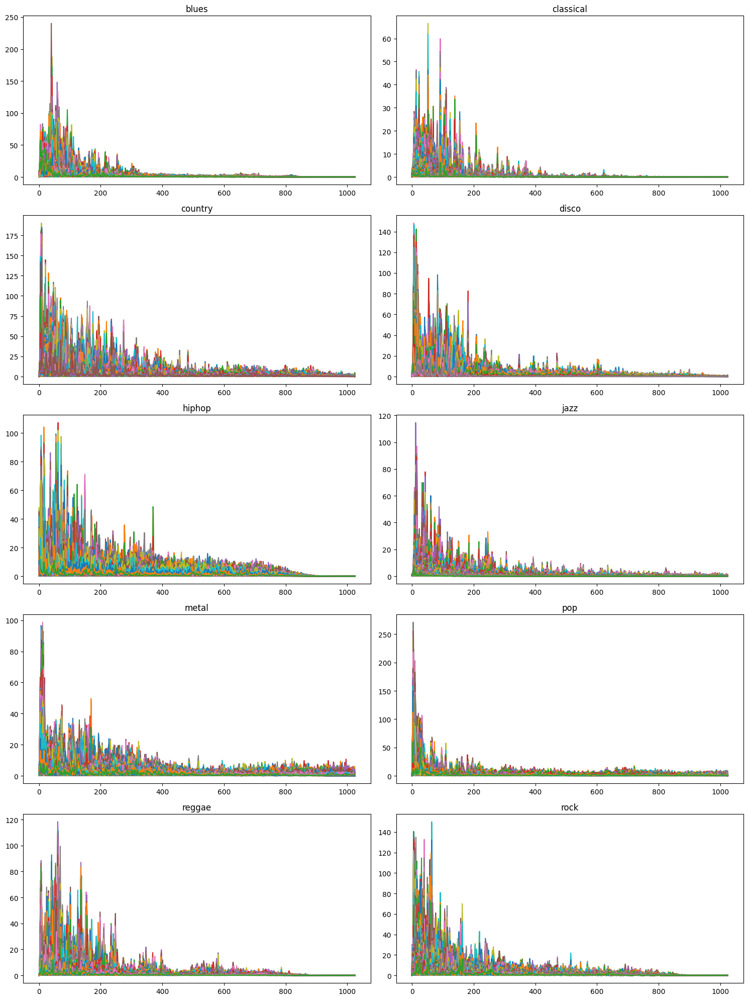

In [66]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    stft_data = np.abs(librosa.stft(y=data, n_fft = n_fft, hop_length=hop_length))
    
    ax[i][j].plot(stft_data)

    ax[i][j].set_title(genre)

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Spectograms

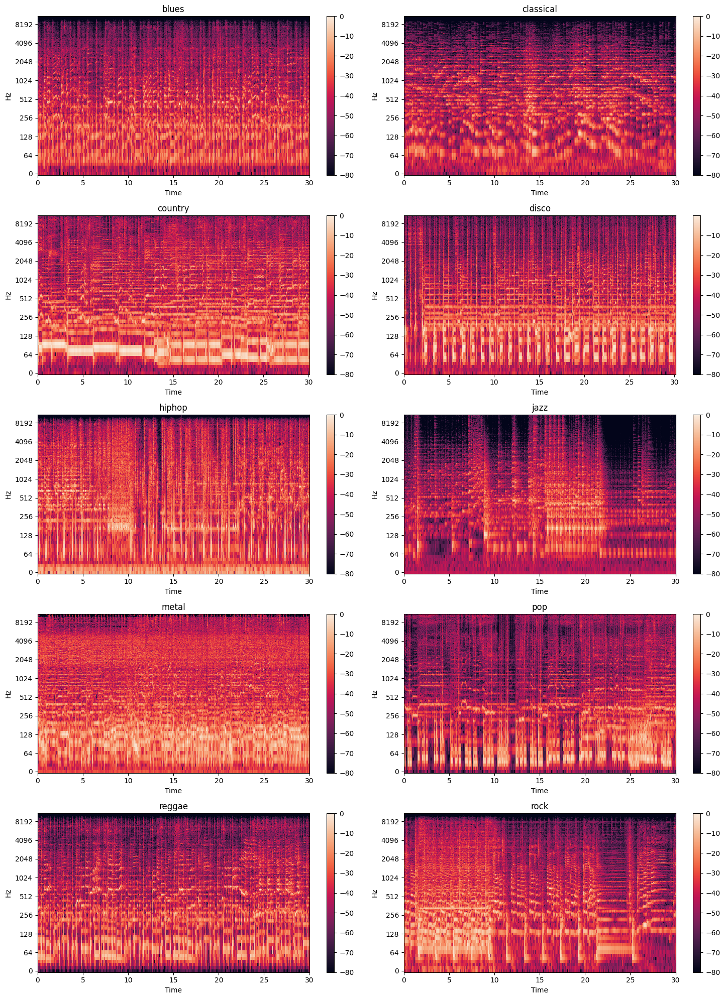

In [67]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    stft_data = np.abs(librosa.stft(y=data, n_fft=n_fft, hop_length=hop_length))
    
    DB = librosa.amplitude_to_db(stft_data, ref=np.max)
    
    img = librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis= 'time', y_axis= 'log', cmap='rocket', ax=ax[i][j])
    fig.colorbar(img, ax=ax[i][j])
    
    
    ax[i][j].set_title(genre)

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Mel Spectograms

/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/2296904932.py:8: FutureWarning: Pass y=[ 0.00732422  0.01660156  0.00762939 ... -0.05560303 -0.06106567
 -0.06417847] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel_spec = librosa.feature.melspectrogram(data, sr=sr, hop_length=hop_length)
/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/2296904932.py:8: FutureWarning: Pass y=[-0.02008057 -0.01748657  0.00418091 ...  0.01934814  0.027771
  0.03131104] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel_spec = librosa.feature.melspectrogram(data, sr=sr, hop_length=hop_length)
/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/2296904932.py:8: FutureWarning: Pass y=[-0.13415527 -0.19485474 -0.04257202 ...  0.2260437   0.15042114
  0.04238892] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  

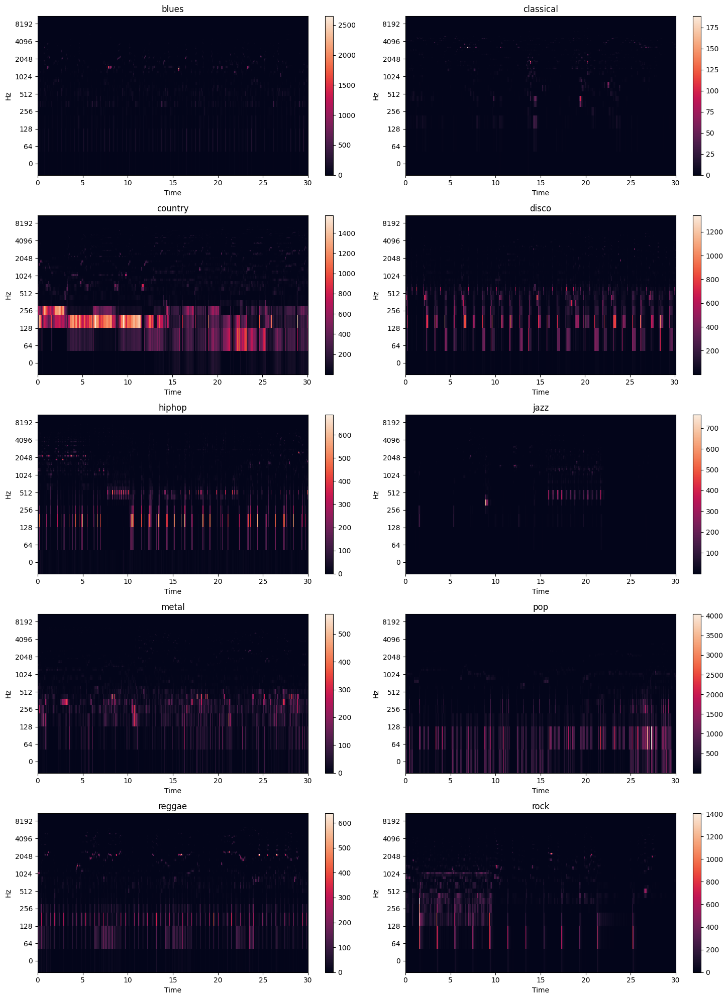

In [68]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    mel_spec = librosa.feature.melspectrogram(data, sr=sr, hop_length=hop_length)
    
    mel_spec_db = librosa.amplitude_to_db(mel_spec, ref=np.max)
    
    img = librosa.display.specshow(mel_spec, sr=sr, hop_length=hop_length, x_axis= 'time', y_axis= 'log', cmap='rocket', ax=ax[i][j])
    fig.colorbar(img, ax=ax[i][j])
    
    
    ax[i][j].set_title(genre)

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Mel Frequency Cepstral Coefficients

/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/1669796511.py:8: FutureWarning: Pass y=[ 0.00732422  0.01660156  0.00762939 ... -0.05560303 -0.06106567
 -0.06417847] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mfcc_data = np.abs(librosa.feature.mfcc(data, sr=sr))
/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/1669796511.py:8: FutureWarning: Pass y=[-0.02008057 -0.01748657  0.00418091 ...  0.01934814  0.027771
  0.03131104] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mfcc_data = np.abs(librosa.feature.mfcc(data, sr=sr))
/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/1669796511.py:8: FutureWarning: Pass y=[-0.13415527 -0.19485474 -0.04257202 ...  0.2260437   0.15042114
  0.04238892] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mfcc_data = np.abs(librosa.feature.mfcc(data, sr

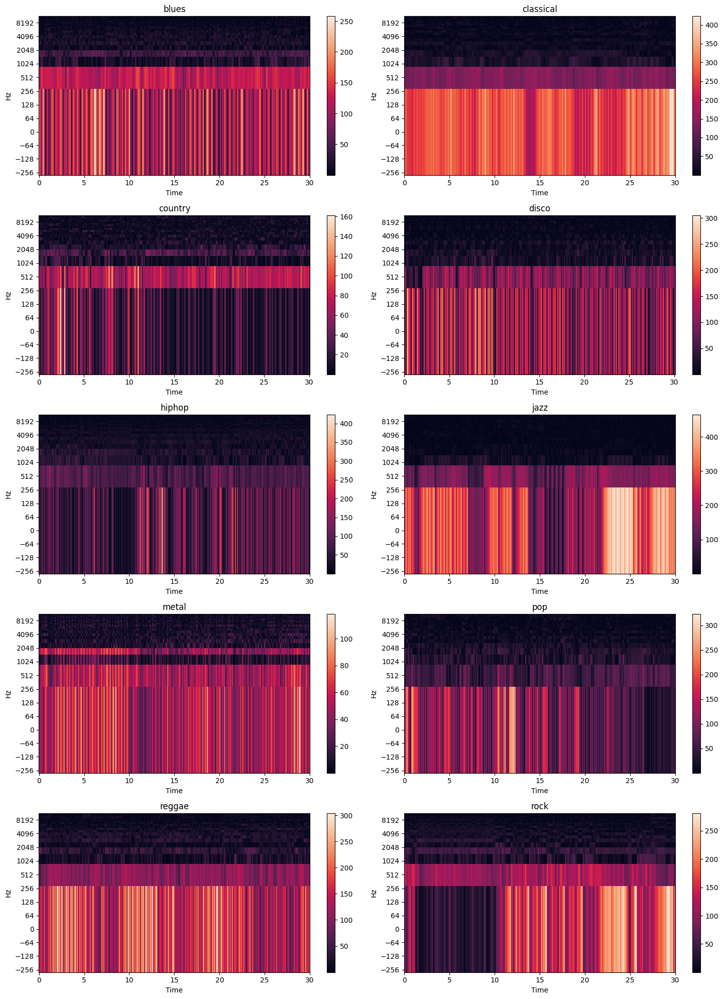

In [69]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    mfcc_data = np.abs(librosa.feature.mfcc(data, sr=sr))
    
    
    img = librosa.display.specshow(mfcc_data, sr=sr, x_axis= 'time', y_axis= 'log', cmap='rocket', ax=ax[i][j])
    fig.colorbar(img, ax=ax[i][j])
    
    
    ax[i][j].set_title(genre)

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Chromagrams

/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/1334318543.py:8: FutureWarning: Pass y=[ 0.00732422  0.01660156  0.00762939 ... -0.05560303 -0.06106567
 -0.06417847] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  chromagram = librosa.feature.chroma_stft(data, sr=sr, hop_length=hop_length)
/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/1334318543.py:8: FutureWarning: Pass y=[-0.02008057 -0.01748657  0.00418091 ...  0.01934814  0.027771
  0.03131104] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  chromagram = librosa.feature.chroma_stft(data, sr=sr, hop_length=hop_length)
/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_32354/1334318543.py:8: FutureWarning: Pass y=[-0.13415527 -0.19485474 -0.04257202 ...  0.2260437   0.15042114
  0.04238892] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  ch

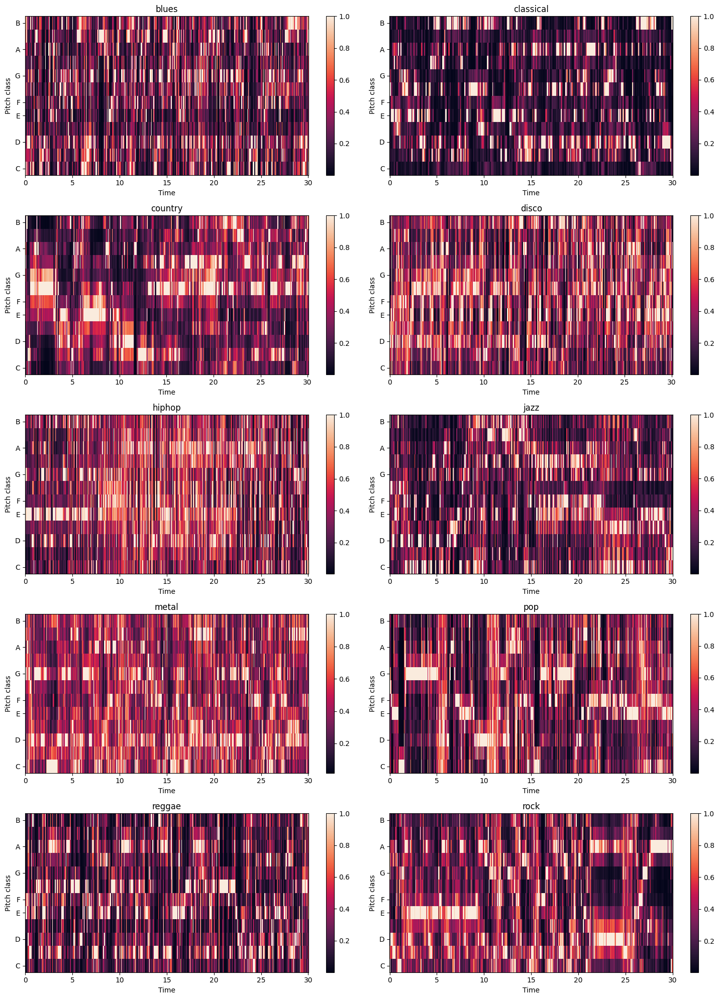

In [70]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    chromagram = librosa.feature.chroma_stft(data, sr=sr, hop_length=hop_length)
    
    img = librosa.display.specshow(chromagram, x_axis= 'time', y_axis= 'chroma', cmap='rocket', ax=ax[i][j])
    fig.colorbar(img, ax=ax[i][j])
    
    
    ax[i][j].set_title(genre)

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Harmonics and Percussive elements

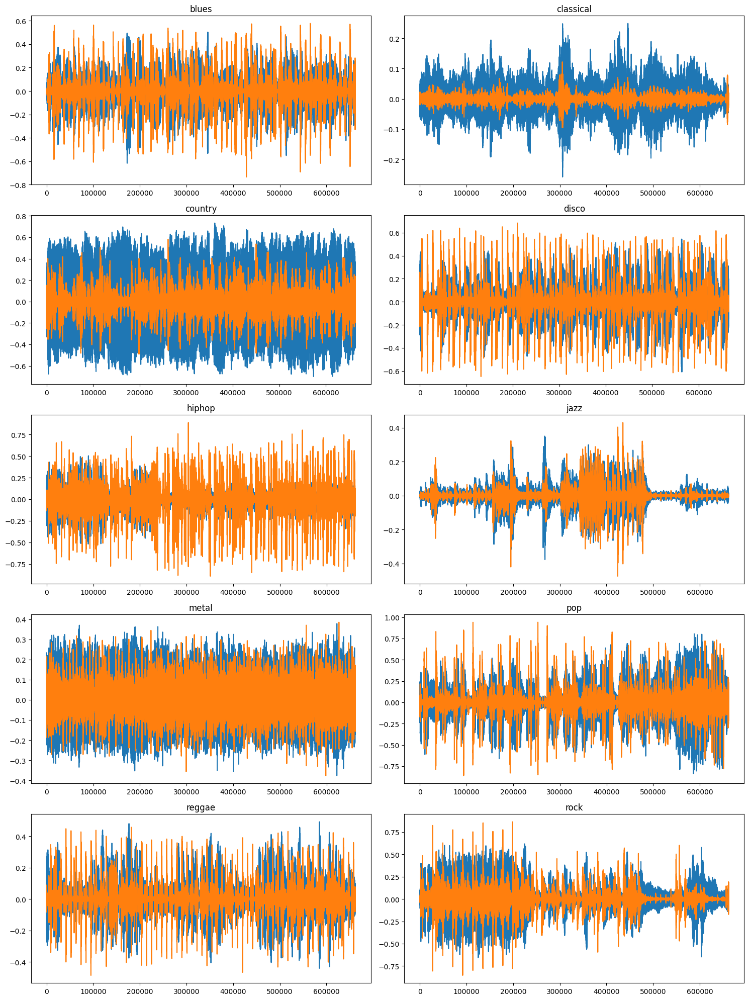

In [71]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    y_harm, y_perc = librosa.effects.hpss(data)
    
    ax[i][j].plot(y_harm)
    ax[i][j].plot(y_perc)
    
    ax[i][j].set_title(genre)

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Finally, tempo and beats of the audio files

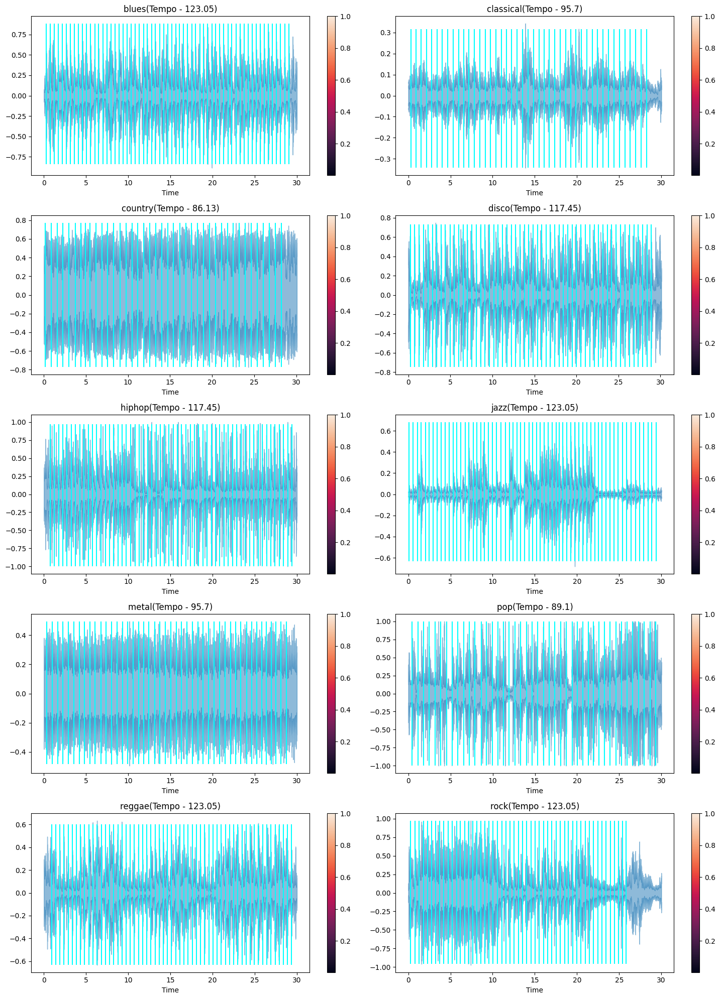

In [72]:
fig, ax= plt.subplots(nrows=5, ncols=2, figsize=(15, 20))
i = 0
j = 0
for genre in genre_dict.keys():
    
    data,sr = librosa.load(audio_path + genre + "/" + genre + ".00000.wav")
    
    tempo, beat_times = librosa.beat.beat_track(y=data, sr=sr, units='time')
    
    librosa.display.waveshow(y=data, sr=sr, alpha= 0.5, ax=ax[i][j])
    fig.colorbar(img, ax=ax[i][j])
    
    ax[i][j].vlines(beat_times, np.min(data), np.max(data), color='cyan')
                    
    ax[i][j].set_title(genre + "(Tempo - " + str(round(tempo,2)) + ")")

    if(j == 1):
        i = i + 1
        j = 0
    else:
        j = j + 1

plt.tight_layout()
plt.show()

Let's do some data exploration on our dataset.

In [3]:
# Loading a data and taking a look
data = pd.read_csv("/Users/frisbi01/Coding/DS course/Phase 3/Final Project/Data/features_3_sec.csv")
data = data.iloc[0:, 1:]
data.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [194]:
data.describe()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,9990.000000,9990.000000,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,...,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000
mean,0.379534,0.084876,0.130859,2.676388e-03,2199.219431,4.166727e+05,2241.385959,1.182711e+05,4566.076592,1.628790e+06,...,1.448240,49.988755,-4.198706,51.962753,0.739943,52.488851,-2.497306,54.973829,-0.917584,57.322614
std,0.090466,0.009637,0.068545,3.585628e-03,751.860611,4.349644e+05,543.854449,1.013505e+05,1642.065335,1.489398e+06,...,5.735149,34.442816,5.677379,36.400669,5.181313,38.177120,5.111799,41.585677,5.253243,46.444212
min,0.107108,0.015345,0.000953,4.379535e-08,472.741636,8.118813e+02,499.162910,1.183520e+03,658.336276,1.145102e+03,...,-26.850016,1.325786,-27.809795,1.624544,-20.733809,3.437439,-27.448456,3.065302,-35.640659,0.282131
25%,0.315698,0.079833,0.083782,6.145900e-04,1630.680158,1.231961e+05,1887.455790,4.876553e+04,3378.311110,5.595514e+05,...,-2.227478,29.584894,-7.951722,29.863448,-2.516638,29.636197,-5.734123,30.496412,-4.004475,30.011365
50%,0.384741,0.085108,0.121253,1.491318e-03,2208.628236,2.650692e+05,2230.575595,8.996072e+04,4631.377892,1.160080e+06,...,1.461623,41.702393,-4.443021,42.393583,0.733772,41.831377,-2.702366,43.435253,-1.030939,44.332155
75%,0.442443,0.091092,0.176328,3.130862e-03,2712.581884,5.624152e+05,2588.340505,1.585674e+05,5591.634521,2.262437e+06,...,5.149752,59.274619,-0.726945,61.676964,3.888734,62.033906,0.514246,65.328602,2.216603,68.210421
max,0.749481,0.120964,0.442567,3.261522e-02,5432.534406,4.794119e+06,3708.147554,1.235143e+06,9487.446477,1.298320e+07,...,39.144405,683.932556,34.048843,529.363342,36.970322,629.729797,31.365425,1143.230591,34.212101,910.473206


In [195]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9990 entries, blues.00000.0.wav to rock.00099.9.wav
Data columns (total 57 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   chroma_stft_mean         9990 non-null   float64
 1   chroma_stft_var          9990 non-null   float64
 2   rms_mean                 9990 non-null   float64
 3   rms_var                  9990 non-null   float64
 4   spectral_centroid_mean   9990 non-null   float64
 5   spectral_centroid_var    9990 non-null   float64
 6   spectral_bandwidth_mean  9990 non-null   float64
 7   spectral_bandwidth_var   9990 non-null   float64
 8   rolloff_mean             9990 non-null   float64
 9   rolloff_var              9990 non-null   float64
 10  zero_crossing_rate_mean  9990 non-null   float64
 11  zero_crossing_rate_var   9990 non-null   float64
 12  harmony_mean             9990 non-null   float64
 13  harmony_var              9990 non-null   float64
 14  p

In [115]:
data.isnull().sum()

length                     0
chroma_stft_mean           0
chroma_stft_var            0
rms_mean                   0
rms_var                    0
spectral_centroid_mean     0
spectral_centroid_var      0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
rolloff_mean               0
rolloff_var                0
zero_crossing_rate_mean    0
zero_crossing_rate_var     0
harmony_mean               0
harmony_var                0
perceptr_mean              0
perceptr_var               0
tempo                      0
mfcc1_mean                 0
mfcc1_var                  0
mfcc2_mean                 0
mfcc2_var                  0
mfcc3_mean                 0
mfcc3_var                  0
mfcc4_mean                 0
mfcc4_var                  0
mfcc5_mean                 0
mfcc5_var                  0
mfcc6_mean                 0
mfcc6_var                  0
mfcc7_mean                 0
mfcc7_var                  0
mfcc8_mean                 0
mfcc8_var                  0
mfcc9_mean    

Let's also build a correlation matrix for the features. To do that, we should only keep numeric features and leave out of our matrix columns like the label or the file name, and we should also keep the 'means' columns which are more important overall.

In [116]:
# Keeping the means and making a correlation heatmap
mean_cols = [col for col in data.columns if 'mean' in col]
corr = data[mean_cols].corr()

<AxesSubplot: >

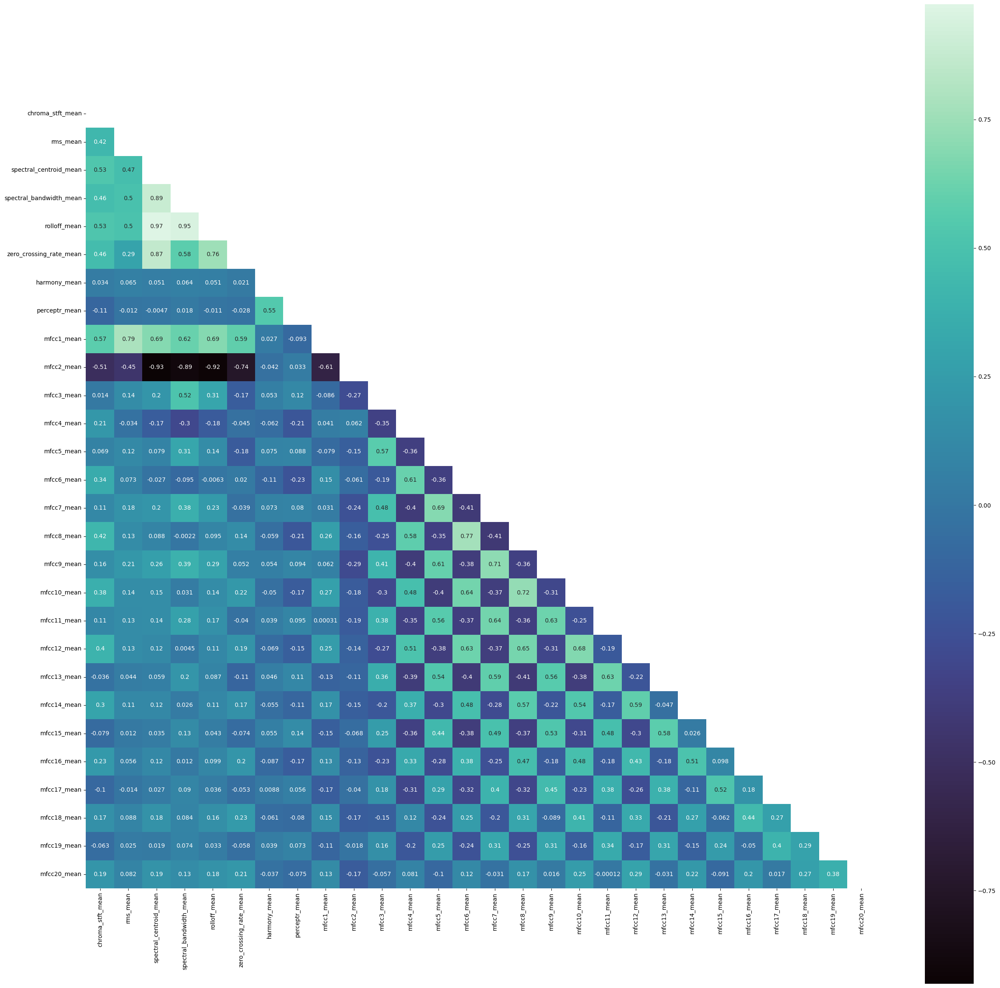

In [117]:
plt.figure(figsize=(30,30))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, square=True, cmap='mako', annot=True, mask=mask)

We should start preparing our data for our models

In [5]:
# Creating our train and test sets

X = data.drop("label", axis = 1)
y = data["label"]

In [6]:
# Normalising and splitting our data

cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

X = pd.DataFrame(np_scaled, columns = cols)

X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=0.3, random_state = 0)

le = LabelEncoder()
xgb_y_train = le.fit_transform(y_train)

In [7]:
# We can define a function to run models and output the accuracy of each model

def model_performance(model, title = " "):
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    
    print('Accuracy', title, ':', round(accuracy_score(y_test, pred), 5), '\n')
    
def model_xgb(model, title = " "):
    model.fit(X_train, xgb_y_train)
    pred = model.predict(X_test)
    
    print('Accuracy', title, ':', round(accuracy_score(y_test, pred), 5), '\n')

In [196]:
# We will try out different models and see which one is performing the best

# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_performance(knn, "KNN")

# Decission trees
dtree = DecisionTreeClassifier()
model_performance(dtree, "Decission trees")

# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_performance(rforest, "Random Forest")

# Support Vector Machine
svm = SVC(decision_function_shape='ovo')
model_performance(svm, "Support Vector Machine")


Accuracy KNN : 0.8008 

Accuracy Decission trees : 0.64198 

Accuracy Random Forest : 0.80147 

Accuracy Support Vector Machine : 0.74975 



In [12]:
# Cross Gradient Booster
xgb = XGBClassifier()
xgb.fit(X = X_train, y = xgb_y_train)

y_pred = xgb.predict(X_test)

# Inverting the encoding of the y
y_pred = le.inverse_transform(y_pred)

cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[265   1   7   3   2   4   3   0   1   1]
 [  0 283   1   0   0   7   0   0   0   4]
 [ 11   2 278   1   0   8   0   1   5   7]
 [  6   4   5 254   4   1   1   5   5   5]
 [  3   0   5   4 269   2   5   6   5   2]
 [  2   9  10   0   0 270   0   0   0   4]
 [  2   1   0   6   5   0 288   0   0  10]
 [  0   1   8  12   5   2   0 252   3   4]
 [  3   2   8   2  10   1   0   6 282   4]
 [  9   5  13   5   2   7  11   3   2 242]]


0.8952285618952286

In [14]:
# Cross Gradient Booster (Random Forest)

xgbrf = XGBRFClassifier()
xgbrf.fit(X = X_train, y = xgb_y_train)

y_pred = xgb.predict(X_test)

# Inverting the encoding of y
y_pred = le.inverse_transform(y_pred)

cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[265   1   7   3   2   4   3   0   1   1]
 [  0 283   1   0   0   7   0   0   0   4]
 [ 11   2 278   1   0   8   0   1   5   7]
 [  6   4   5 254   4   1   1   5   5   5]
 [  3   0   5   4 269   2   5   6   5   2]
 [  2   9  10   0   0 270   0   0   0   4]
 [  2   1   0   6   5   0 288   0   0  10]
 [  0   1   8  12   5   2   0 252   3   4]
 [  3   2   8   2  10   1   0   6 282   4]
 [  9   5  13   5   2   7  11   3   2 242]]


0.8952285618952286

We will use the cosine similarity library to find the similarity between each combination of songs in the dataset.

In [24]:
data = pd.read_csv("/Users/frisbi01/Coding/DS course/Phase 3/Final Project/Data/features_3_sec.csv", index_col='filename')

# We need the labes seperately
labels = data[['label']]

data = data.drop(['length','label'], axis=1)
data.head()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.0.wav,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,...,-2.853603,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767
blues.00000.1.wav,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,...,4.074709,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081
blues.00000.2.wav,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,...,4.806280,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122
blues.00000.3.wav,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,...,-1.359111,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678
blues.00000.4.wav,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,...,2.092937,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694


In [25]:
# Scaling the data
data_sc = preprocessing.scale(data)

# Making use of the cosine similarity
similarity = cosine_similarity(data_sc)

sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()

filename,blues.00000.0.wav,blues.00000.1.wav,blues.00000.2.wav,blues.00000.3.wav,blues.00000.4.wav,blues.00000.5.wav,blues.00000.6.wav,blues.00000.7.wav,blues.00000.8.wav,blues.00000.9.wav,...,rock.00099.0.wav,rock.00099.1.wav,rock.00099.2.wav,rock.00099.3.wav,rock.00099.4.wav,rock.00099.5.wav,rock.00099.6.wav,rock.00099.7.wav,rock.00099.8.wav,rock.00099.9.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.0.wav,1.000000,0.566223,0.574240,0.762002,0.761645,0.650941,0.695498,0.766532,0.760135,0.627689,...,0.221833,0.154208,-0.013789,0.372188,0.456640,0.387531,0.382302,0.048050,0.457812,0.353021
blues.00000.1.wav,0.566223,1.000000,0.639639,0.749346,0.615946,0.605654,0.692011,0.641135,0.786465,0.765471,...,0.412396,0.519078,-0.069361,0.570347,0.617002,0.634812,0.509724,-0.040774,0.553467,0.329800
blues.00000.2.wav,0.574240,0.639639,1.000000,0.659545,0.715466,0.595426,0.750551,0.733546,0.525333,0.580205,...,0.290419,0.320014,0.056435,0.469341,0.306737,0.432974,0.198399,0.037191,0.530360,0.192676
blues.00000.3.wav,0.762002,0.749346,0.659545,1.000000,0.796544,0.787118,0.772266,0.810613,0.729950,0.617242,...,0.257953,0.348760,-0.088100,0.524289,0.524339,0.515108,0.395785,-0.035468,0.542242,0.327122
blues.00000.4.wav,0.761645,0.615946,0.715466,0.796544,1.000000,0.749515,0.806425,0.843051,0.619045,0.618250,...,0.339456,0.362799,-0.159643,0.502492,0.489419,0.527737,0.423894,-0.091949,0.589148,0.380534


In [91]:
def set_device():
  device = "cuda" if torch.cuda.is_available() else "cpu"
  if device != "cuda":
      print("WARNING: For this notebook to perform best, "
          "if possible, in the menu under `Runtime` -> "
          "`Change runtime type.`  select `GPU` ")
  else:
      print("GPU is enabled in this notebook.")

  return device

In [87]:
def plot_loss_accuracy(train_loss, train_acc, validation_loss, validation_acc):
  epochs = len(train_loss)
  fig, (ax1, ax2) = plt.subplots(1, 2)
  ax1.plot(list(range(epochs)), train_loss, label='Training Loss')
  ax1.plot(list(range(epochs)), validation_loss, label='Validation Loss')
  ax1.set_xlabel('Epochs')
  ax1.set_ylabel('Loss')
  ax1.set_title('Epoch vs Loss')
  ax1.legend()

  ax2.plot(list(range(epochs)), train_acc, label='Training Accuracy')
  ax2.plot(list(range(epochs)), validation_acc, label='Validation Accuracy')
  ax2.set_xlabel('Epochs')
  ax2.set_ylabel('Accuracy')
  ax2.set_title('Epoch vs Accuracy')
  ax2.legend()
  fig.set_size_inches(15.5, 5.5)
  plt.show()

In [92]:
device = set_device()

In [81]:
# Create folder with training, testing and validation data.

spectrograms_dir = "Data/images_original/"
folder_names = ['Data/train/', 'Data/test/', 'Data/val/']
train_dir = folder_names[0]
test_dir = folder_names[1]
val_dir = folder_names[2]

for f in folder_names:
  if os.path.exists(f):
    shutil.rmtree(f)
    os.mkdir(f)
  else:
    os.mkdir(f)

In [175]:
genres = list(os.listdir(spectrograms_dir))
genres.pop(1)

print(genres)

['pop', 'metal', 'disco', 'blues', 'reggae', 'classical', 'rock', 'hiphop', 'country', 'jazz']


In [176]:

for g in genres:
  # Find all images and split in train, test, and validation
  src_file_paths= []
  for im in glob.glob(os.path.join(spectrograms_dir, f'{g}',"*.png"), recursive=True):
    src_file_paths.append(im)
  random.shuffle(src_file_paths)
  test_files = src_file_paths[0:10]
  val_files = src_file_paths[10:20]
  train_files = src_file_paths[20:]

  #  Make destination folders for train and test images
  for f in folder_names:
    if not os.path.exists(os.path.join(f + f"{g}")):
      os.mkdir(os.path.join(f + f"{g}"))

  # Copy training and testing images over
  for f in train_files:
    shutil.copy(f, os.path.join(os.path.join(train_dir + f"{g}") + '/',os.path.split(f)[1]))
  for f in test_files:
    shutil.copy(f, os.path.join(os.path.join(test_dir + f"{g}") + '/',os.path.split(f)[1]))
  for f in val_files:
    shutil.copy(f, os.path.join(os.path.join(val_dir + f"{g}") + '/',os.path.split(f)[1]))

In [180]:
train_dir = "/Users/frisbi01/Coding/DS course/Phase 3/Final Project/Data/train/"
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(train_dir,target_size=(288,432),color_mode="rgba",class_mode='categorical',batch_size=128)

validation_dir = "/Users/frisbi01/Coding/DS course/Phase 3/Final Project/Data/test/"
vali_datagen = ImageDataGenerator(rescale=1./255)
vali_generator = vali_datagen.flow_from_directory(validation_dir,target_size=(288,432),color_mode='rgba',class_mode='categorical',batch_size=128)

Found 997 images belonging to 10 classes.
Found 343 images belonging to 10 classes.


In [181]:
def GenreModel(input_shape = (288,432,4),classes=10):
  
  X_input = Input(input_shape)

  X = Conv2D(8,kernel_size=(3,3),strides=(1,1))(X_input)
  X = BatchNormalization(axis=3)(X)
  X = Activation('relu')(X)
  X = MaxPooling2D((2,2))(X)
  
  X = Conv2D(16,kernel_size=(3,3),strides = (1,1))(X)
  X = BatchNormalization(axis=3)(X)
  X = Activation('relu')(X)
  X = MaxPooling2D((2,2))(X)
  
  X = Conv2D(32,kernel_size=(3,3),strides = (1,1))(X)
  X = BatchNormalization(axis=3)(X)
  X = Activation('relu')(X)
  X = MaxPooling2D((2,2))(X)

  X = Conv2D(64,kernel_size=(3,3),strides=(1,1))(X)
  X = BatchNormalization(axis=-1)(X)
  X = Activation('relu')(X)
  X = MaxPooling2D((2,2))(X)
  
  X = Conv2D(128,kernel_size=(3,3),strides=(1,1))(X)
  X = BatchNormalization(axis=-1)(X)
  X = Activation('relu')(X)
  X = MaxPooling2D((2,2))(X)

  
  X = Flatten()(X)
  
  

  X = Dense(classes, activation='softmax', name='fc' + str(classes))(X)

  model = Model(inputs=X_input,outputs=X,name='GenreModel')

  return model


In [182]:
import keras.backend as K
def get_f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val
  
model = GenreModel(input_shape=(288,432,4),classes=10)
opt = Adam(learning_rate=0.0005)
model.compile(optimizer = opt,loss='categorical_crossentropy',metrics=['accuracy'])

In [188]:
model.fit_generator(train_generator,epochs=70,validation_data=vali_generator)

/var/folders/3d/d8pgccgx0_v8fncxrs1jcvzm0000gn/T/ipykernel_34421/1496518560.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(train_generator,epochs=70,validation_data=vali_generator)


Epoch 1/70
8/8 [==============================] - 58s 7s/step - loss: 0.9602 - accuracy: 0.6790 - val_loss: 2.6404 - val_accuracy: 0.0962
Epoch 2/70
8/8 [==============================] - 59s 7s/step - loss: 0.8349 - accuracy: 0.7402 - val_loss: 2.7120 - val_accuracy: 0.1050
Epoch 3/70
8/8 [==============================] - 57s 7s/step - loss: 0.7037 - accuracy: 0.7964 - val_loss: 2.7915 - val_accuracy: 0.1399
Epoch 4/70
8/8 [==============================] - 56s 7s/step - loss: 0.5775 - accuracy: 0.8415 - val_loss: 2.9232 - val_accuracy: 0.0962
Epoch 5/70
8/8 [==============================] - 57s 7s/step - loss: 0.4685 - accuracy: 0.8877 - val_loss: 2.9526 - val_accuracy: 0.1574
Epoch 6/70
8/8 [==============================] - 59s 8s/step - loss: 0.3752 - accuracy: 0.9137 - val_loss: 2.9697 - val_accuracy: 0.0962
Epoch 7/70
8/8 [==============================] - 61s 8s/step - loss: 0.2902 - accuracy: 0.9539 - val_loss: 3.0904 - val_accuracy: 0.1399
Epoch 8/70
8/8 [==================

In [189]:
model.save('/Users/frisbi01/Coding/DS course/Phase 3/Final Project/Genre Model/genre.h5')